
# Walkability Visualization
As part of our ENG-3217 lab course, we were tasked to map the walkability rating of the city with our own data. This jupyter notebook is for the visualization and description of the data we have gathered.

### Contributors

**Data Submission (roll):** 2, 3, 5, 7, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 58, 59, 60, 61, 62, 63, 85, 86, 92, 94, 97, 242, 243, 244, 246, 248 <br>

**Planning & Discussion for visualization:** <br>
Jawad Habib (Roll: 10)<br>
Farhan Mahmud (Roll: 16) <br>
Deeparghya Dutta Barua (Roll: 28)<br>
Jahir Sadik Monon (Roll: 32) <br> 
K. M. Azwad Hossain (Roll: 36)<br>
Kazi Shadman Sakib (Roll: 97) <br>

**Code:**<br>
Jawad Habib (Roll: 10)<br> 
Deeparghya Dutta Barua (Roll: 28) <br>
Jahir Sadik Monon (Roll: 32)<br> 
K. M. Azwad Hossain (Roll: 36) <br>


In [1]:
import io
import os
import folium
import pandas as pd
import datetime
from glob import glob
from pathlib import Path
import base64
import gpxpy
import gpxpy.gpx
from exif import Image
from PIL import Image as Image_PIL
from pprint import pprint
import traceback
import math
import json
from colour import Color
from geopy.distance import great_circle as GRC
from geopy.geocoders import Nominatim

### Total Submissions and rolls

In [2]:
data_dir_path = os.path.join(os.getcwd(), 'data')
print(f"Total Folders In Submission: {len(os.listdir(data_dir_path))}, \nFolders in \data: {os.listdir(data_dir_path)}\n")
roll_list = []
for folder_name in os.listdir(data_dir_path):
    for roll in folder_name.split(','):
        roll_list.append(int(roll))
roll_list.sort()
print(f"Total Submissions: {len(roll_list)} \nSubmissions by rolls: {roll_list}")

Total Folders In Submission: 52, 
Folders in \data: ['002', '003', '005,017,028', '007,012', '009', '010,013', '014', '015,020', '016', '018,044', '019', '021', '022', '023', '024', '025', '026,043', '029', '030', '031,047', '032', '033', '034', '035,038', '036', '037', '039', '040', '042', '043', '045', '046', '048', '050', '051,061', '052', '053', '055', '056', '058', '059', '060', '062', '063', '086', '094', '097', '242', '243', '244', '246', '248']

Total Submissions: 62 
Submissions by rolls: [2, 3, 5, 7, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 58, 59, 60, 61, 62, 63, 86, 94, 97, 242, 243, 244, 246, 248]


In [3]:
def process_gpx_to_df(file_name):

    gpx = gpxpy.parse(open(file_name))

    #(1)make DataFrame
    track = gpx.tracks[0]
    # Load the data into a Pandas dataframe (by way of a list)
    data = []
    for i in range(0, len(track.segments)):
        segment = track.segments[i]
        segment_length = segment.length_3d()
        for point_idx, point in enumerate(segment.points):
            data.append([point.longitude, point.latitude, point.elevation,
                        point.time, segment.get_speed(point_idx)])
    columns = ['Longitude', 'Latitude', 'Altitude', 'Time', 'Speed']
    gpx_df = pd.DataFrame(data, columns=columns)

    #2(make points tuple for line)
    points = []
    for track in gpx.tracks:
        for segment in track.segments:
            for point in segment.points:
                points.append(tuple([point.latitude, point.longitude]))

    return gpx_df, points

In [4]:
def getfolderDictHTML(folder_name = "032"):
    my_walkability_csv = pd.read_csv(f"{data_dir_path}\\{folder_name}\\Walkability Sheet.csv", index_col='.gpx FileName')
    my_gpx_filenames = list(my_walkability_csv.index.values)
    html_dict = {}
    for filename in my_gpx_filenames:
        r_w_r = my_walkability_csv.at[filename, "Rough Walkability Rating"]
        t_d = my_walkability_csv.at[filename, "Track Description"] if type(my_walkability_csv.at[filename, "Track Description"]) == str else "None"
        o_c = my_walkability_csv.at[filename, "Other Comments"] if type(my_walkability_csv.at[filename, "Other Comments"]) == str else "None"
        ob_cnt = my_walkability_csv.at[filename, "Obstacles Count"]
        clns = my_walkability_csv.at[filename, "Cleanliness/100 (High means clean)"]
        file_html = f"""<h4>{folder_name}</h1>
                    <p> Rating: {r_w_r}, Obstacles Count: {ob_cnt} <br>
                        Cleanliness/100: {clns} <br> 
                        Track Desc.: {t_d[:50]} <br>
                        Other Comments: {o_c[:50]}
                    </p>"""
        html_dict[filename] = file_html
    return html_dict

In [5]:
def getfolderDictToolTip(folder_name = "032"):
    my_walkability_csv = pd.read_csv(f"{data_dir_path}\\{folder_name}\\Walkability Sheet.csv", index_col='.gpx FileName')
    my_gpx_filenames = list(my_walkability_csv.index.values)
    tooltip_dict = {}
    for filename in my_gpx_filenames:
        r_w_r = my_walkability_csv.at[filename, "Rough Walkability Rating"]
        t_d = my_walkability_csv.at[filename, "Track Description"] if type(my_walkability_csv.at[filename, "Track Description"]) == str else "None"
        o_c = my_walkability_csv.at[filename, "Other Comments"] if type(my_walkability_csv.at[filename, "Other Comments"]) == str else "None"
        ob_cnt = my_walkability_csv.at[filename, "Obstacles Count"]
        clns = my_walkability_csv.at[filename, "Cleanliness/100 (High means clean)"]
        file_tooltip = f"Submitted by: {folder_name}, Rating: {r_w_r}, Obstacles Count: {ob_cnt}, Cleanliness/100: {clns}, Track Desc.: {t_d[:50]}, Other Comments: {o_c[:50]}"
        tooltip_dict[filename] = file_tooltip
    return tooltip_dict

In [6]:
def plot_gpx(main_map, folder_name, fileName, trk_html, tooptip_text, gpx_color = 'red'):
    gpx_file_path = f"{os.getcwd()}\\data\\{folder_name}\\gpx\\{fileName}"
    df, points = process_gpx_to_df(gpx_file_path)
    popup_text = folium.map.Popup(html=trk_html,max_width='100%', show=False, sticky=False)
    folium.PolyLine(points, color=gpx_color, weight=4.5, opacity=.5, popup  = popup_text, tooltip = tooptip_text).add_to(main_map)

In [7]:
red = Color("red")
yellow = Color("yellow")
colors_red = list(red.range_to(Color("yellow"),66))
colors_yellow = list(yellow.range_to(Color("green"),36))[1:]
colors = colors_red + colors_yellow

In [8]:
def get_exif_date(img_path):

    timestamp = None

    with open(img_path, 'rb') as fp:
        img = Image(fp)

    try:
        orig_date = img.datetime_original
        parsed_date = datetime.datetime.strptime(orig_date, '%Y:%m:%d %H:%M:%S')
        timestamp = parsed_date.timestamp()
    except (AttributeError, KeyError) as ke:
        try:
            img_p = Path(img_path)
            timestamp = datetime.datetime.strptime(img_p.stem[:15], '%Y%m%d_%H%M%S').timestamp()
        except ValueError:
            pass

    return timestamp


def get_gpx_rows(gpx_paths):
    lookup_list = []
    reverse_map = {}
    for gpx_path in gpx_paths:
        with open(gpx_path, 'r') as fp:
            gpx = gpxpy.parse(fp)
        for track in gpx.tracks:
            for segment in track.segments:
                for point in segment.points:
                    point_ts = point.time.timestamp()
                    lookup_list.append(point_ts)
                    reverse_map[point_ts] = (point.latitude, point.longitude)
    return lookup_list, reverse_map


def resolve_coords(roll_root):
    roll_root_path = data_dir_path / Path(roll_root)
    gpxs_path = str(roll_root_path / 'gpx' / '*.gpx')
    imgs_path = str(roll_root_path / 'images' / '*.jpg')
    lookup_list, reverse_map = get_gpx_rows(glob(gpxs_path))
    img_coords = []
    for img_path in glob(imgs_path):
        img_ts = get_exif_date(img_path)
        if not img_ts:
            # print(f'Skipped {img_path}, date not found')
            continue
        closest_gpx_ts = min(lookup_list, key=lambda x: abs(x - img_ts))
        if abs(closest_gpx_ts - img_ts) > 60:
            # print(f'Skipped {img_path}, threshold exceeded')
            continue
        closest_latlng = reverse_map[closest_gpx_ts]
        img_coords.append(
            {
                'img_path': img_path,
                'latlng': closest_latlng
            }
        )
    return img_coords

In [9]:
def calculate_track_distance(gpx_df):
    distance = 0
    for idx in gpx_df.index:
        # print("Idx = " + str(idx))
        if(idx != 0):
            time_diff_sec = (
                gpx_df.loc[idx, 'Time'] - gpx_df.loc[idx - 1, 'Time']).total_seconds()
            if(math.isnan(gpx_df.loc[idx, 'Speed']) == False and time_diff_sec <= 120):
                distance += GRC((gpx_df.loc[idx - 1, 'Latitude'],
                                gpx_df.loc[idx - 1, 'Longitude']), ((gpx_df.loc[idx, 'Latitude'],
                                gpx_df.loc[idx, 'Longitude']))).m
    return distance

### Calculating distance, obstacle density, creating 'Walkability Sheet All.csv', and a dictionary for everyone's walkability data

In [ ]:
walkability_sheet_all = pd.DataFrame({'': []})
foldername_to_gpxdf = {'': pd.DataFrame({'': []})}
ob_density = pd.Series([], dtype="float64")
ob_part_rng_100m =(0.65, 1.3)

for folder_name in os.listdir(data_dir_path):
    try:
        my_walkability_csv = pd.read_csv(
            f"{data_dir_path}\\{folder_name}\\Walkability Sheet.csv", index_col='.gpx FileName')
        # Adding new columns
        my_walkability_csv['Obstacle Density (#obstacles/100m)'] = [
            "" for i in range(0, my_walkability_csv.shape[0])]
        my_walkability_csv['Obstacle Density (h/m/l)'] = [
            "" for i in range(0, my_walkability_csv.shape[0])]
        my_walkability_csv['Distance (m)'] = [
            0.0 for i in range(0, my_walkability_csv.shape[0])]
        my_walkability_csv['Folder Name'] = [
            folder_name for i in range(0, my_walkability_csv.shape[0])]
        temp_html_dict = getfolderDictHTML(folder_name)
        temp_tooltip_dict = getfolderDictToolTip(folder_name)
        for filename in temp_html_dict:
            gpx_file_path = f"{os.getcwd()}\\data\\{folder_name}\\gpx\\{filename}"
            df, points = process_gpx_to_df(gpx_file_path)

            # Replacing improbable speeds
            df.Speed = df.Speed.map(lambda s: 1.30 if(s >= 2.5) else s)

            # Writing "Distance (m)" column in csv
            distance = calculate_track_distance(df)
            print(folder_name + " " + filename + " distance = " + str(distance))
            my_walkability_csv.loc[filename, 'Distance (m)'] = distance

            ob_cnt = my_walkability_csv.at[filename, "Obstacles Count"]
            if(type(ob_cnt) == str):
                ob_cnt = ob_cnt.upper().strip()

                # Writing "Obstacle Density (#obstacles/100m)" column in csv
                low_end, mid_end = ob_part_rng_100m
                if(ob_cnt == "LOW"):
                    my_walkability_csv.loc[filename,
                                           'Obstacle Density (#obstacles/100m)'] = str(low_end / 2)
                elif(ob_cnt == "MEDIUM"):
                    my_walkability_csv.loc[filename,
                                           'Obstacle Density (#obstacles/100m)'] = str(low_end + (mid_end - low_end) / 2)
                else:
                    my_walkability_csv.loc[filename,
                                           'Obstacle Density (#obstacles/100m)'] = str(mid_end + 1)

                # Writing "Obstacle Density (h/m/l)" column in csv
                my_walkability_csv.loc[filename,
                                       'Obstacle Density (h/m/l)'] = ob_cnt
                
                # Creating dictionary for foldername -> gpx df
                df_mp = pd.DataFrame({'': []})
                df_mp['Longitude'] = df['Longitude']
                df_mp['Latitude'] = df['Latitude']
                df_mp['Altitude'] = df['Altitude']
                df_mp['Time'] = df['Time']
                df_mp['Speed'] = df['Speed']
                df_mp['.gpx FileName'] = filename
                foldername_to_gpxdf[folder_name] = df_mp

            else:                            
                # Writing "Obstacle Density (#obstacles/100m)" column in csv
                ob_density[filename] = (ob_cnt/distance)*100
                my_walkability_csv.loc[filename, 'Obstacle Density (#obstacles/100m)'] = str((ob_cnt/distance)*100)

                # Writing "Obstacle Density (h/m/l)" in csv
                low_end, mid_end = ob_part_rng_100m
                if(ob_density[filename] <= low_end):
                    my_walkability_csv.loc[filename, 'Obstacle Density (h/m/l)'] = "LOW"
                elif(ob_density[filename] <= mid_end):
                    my_walkability_csv.loc[filename,
                                           'Obstacle Density (h/m/l)'] = "MID"
                else:
                    my_walkability_csv.loc[filename,
                                           'Obstacle Density (h/m/l)'] = "HIGH"

                # Creating dictionary for foldername -> gpx df
                df_mp = pd.DataFrame({'': []})
                df_mp['.gpx FileName'] = filename
                df_mp['Longitude'] = df['Longitude']
                df_mp['Latitude'] = df['Latitude']
                df_mp['Altitude'] = df['Altitude']
                df_mp['Time'] = df['Time']
                df_mp['Speed'] = df['Speed']
                df_mp['.gpx FileName'] = filename
                foldername_to_gpxdf[folder_name] = df_mp

        if('Rough Walkability Rating' in walkability_sheet_all.columns):
            # merge the DFs
            walkability_sheet_all = pd.concat([walkability_sheet_all, my_walkability_csv])
        else:
            walkability_sheet_all = my_walkability_csv

        my_walkability_csv.to_csv(
            f"{data_dir_path}\\{folder_name}\\Walkability Sheet.csv")

    except Exception as e:
        print(f"Folder: {folder_name}: \n Exception:{e}")

walkability_sheet_all.to_csv(
    f"{os.getcwd()}\\Walkability Sheet All.csv")
    

print(walkability_sheet_all.head(10))
print("010,013")
print(foldername_to_gpxdf['010,013'])
print(walkability_sheet_all.describe())

In [12]:
def val_transform(val, knee=47, base=10, noexp=False):
    if(val <= knee):
        val = (val / knee) * base
    else:
        val = val - (100 - val) * (knee - base) / (100 - knee)
    if(noexp):
        val = ((pow(math.e, val / 100) - 1) / (math.e - 1)) * 100
    return round(val)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_896

Entirely skipped: 035,038


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)


Entirely skipped: 037


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)


Entirely skipped: 040


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)


Entirely skipped: 043
Entirely skipped: 045
Entirely skipped: 046


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_896

Entirely skipped: 242
Entirely skipped: 243


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8964\3302441787.py:38: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img_n.thumbnail((200, 200), Image_PIL.LANCZOS)



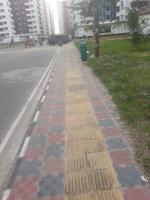
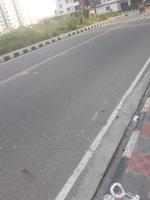
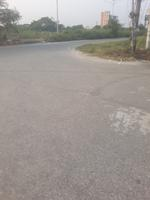
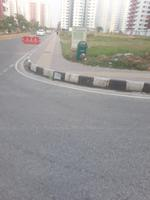
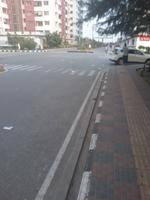
...
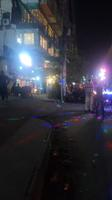
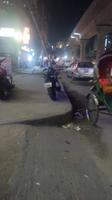
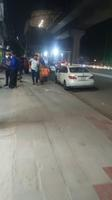
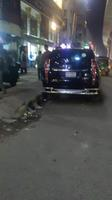
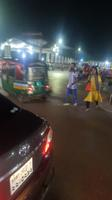

In [13]:
main_map_with_images = folium.Map( location=[23.7289, 90.3989], zoom_start=15, tiles=None)
cleanliness_map_with_images = folium.Map(
    location=[23.7289, 90.3989], zoom_start=15, tiles=None)
obstacle_map_with_images = folium.Map(
    location=[23.7289, 90.3989], zoom_start=15, tiles=None)


folium.TileLayer('openstreetmap', name='OpenStreet Map').add_to(main_map_with_images)
folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}', attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC', name='Nat Geo Map').add_to(main_map_with_images)
folium.TileLayer('http://tile.stamen.com/terrain/{z}/{x}/{y}.jpg', attr='terrain-bcg', name='Terrain Map').add_to(main_map_with_images)

folium.TileLayer('openstreetmap', name='OpenStreet Map').add_to(
    cleanliness_map_with_images)
folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
                 attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC', name='Nat Geo Map').add_to(cleanliness_map_with_images)
folium.TileLayer('http://tile.stamen.com/terrain/{z}/{x}/{y}.jpg',
                 attr='terrain-bcg', name='Terrain Map').add_to(cleanliness_map_with_images)

folium.TileLayer('openstreetmap', name='OpenStreet Map').add_to(
    obstacle_map_with_images)
folium.TileLayer('https://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}',
                 attr='Tiles &copy; Esri &mdash; National Geographic, Esri, DeLorme, NAVTEQ, UNEP-WCMC, USGS, NASA, ESA, METI, NRCAN, GEBCO, NOAA, iPC', name='Nat Geo Map').add_to(obstacle_map_with_images)
folium.TileLayer('http://tile.stamen.com/terrain/{z}/{x}/{y}.jpg',
                 attr='terrain-bcg', name='Terrain Map').add_to(obstacle_map_with_images)

feature_group_marker = folium.FeatureGroup('Show image markers')

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

for folder_name in os.listdir(data_dir_path):
    try:
        folder_coords = resolve_coords(folder_name)

        if not folder_coords:
            print(f'Entirely skipped: {folder_name}')

        for folder_coord in folder_coords:
            byio = io.BytesIO()
            img_n = Image_PIL.open(folder_coord['img_path'])
            img_n.thumbnail((200, 200), Image_PIL.LANCZOS)
            img_n.save(byio, format='JPEG')
            encoded = base64.b64encode(byio.getvalue()).decode('UTF-8')
            i_p = str(Path(folder_coord['img_path']).relative_to(os.getcwd())).replace('\\', '\/')
            html = f'''
            <a href="{i_p}" target="_blank">
                <img src="data:image/jpeg;base64,{encoded}">
            </a>
            '''
            marker = folium.Marker([folder_coord["latlng"][0], folder_coord["latlng"][1]], popup=folium.map.Popup(html=html, max_width=200))
            #marker.add_to(main_map_with_images)
            feature_group_marker.add_child(marker)

        my_walkability_csv = pd.read_csv(f"{data_dir_path}\\{folder_name}\\Walkability Sheet.csv", index_col='.gpx FileName')
        temp_html_dict = getfolderDictHTML(folder_name)
        temp_tooltip_dict = getfolderDictToolTip(folder_name)
        for filename in temp_html_dict:
            r_w_r = val_transform(
                my_walkability_csv.at[filename, "Rough Walkability Rating"], 47, 10)
            clns = val_transform(
                my_walkability_csv.at[filename, "Cleanliness/100 (High means clean)"], 45, 15)
            ob_dnst = my_walkability_csv.at[filename,
                                            "Obstacle Density (#obstacles/100m)"]
            ob_dnst_max = float(
                walkability_sheet_all['Obstacle Density (#obstacles/100m)'].max())
            ob_dnst = ((ob_dnst_max - ob_dnst) / ob_dnst_max) * 100
            ob_dnst = val_transform(ob_dnst, 87, 30, noexp=True)

            plot_gpx(main_map_with_images, folder_name, filename, temp_html_dict[filename], temp_tooltip_dict[filename], gpx_color = colors[r_w_r].hex)
            plot_gpx(cleanliness_map_with_images, folder_name, filename,
                     temp_html_dict[filename], temp_tooltip_dict[filename], gpx_color=colors[clns].hex)
            plot_gpx(obstacle_map_with_images, folder_name, filename,
                     temp_html_dict[filename], temp_tooltip_dict[filename], gpx_color=colors[ob_dnst].hex)

    except Exception as e:
        print(f"Folder: {folder_name}: \n Exception:{e}")

main_map_with_images.add_child(feature_group_marker)
main_map_with_images.add_child(folium.LayerControl())
main_map_with_images.save('main_map_with_images.html')

cleanliness_map_with_images.add_child(feature_group_marker)
cleanliness_map_with_images.add_child(folium.LayerControl())
cleanliness_map_with_images.save('cleanliness_map_with_images.html')

obstacle_map_with_images.add_child(feature_group_marker)
obstacle_map_with_images.add_child(folium.LayerControl())
obstacle_map_with_images.save('obstacle_map_with_images.html')

main_map_with_images

## Code For Finding Area Walkability

In [21]:
list_of_sub = ['suburb', 'borough', 'residential', 'city']
AREAS_CONTAINING_TRACKS = {}
AREA_WISE_SCORE_LIST = {}
AREA_WISE_AVERAGE = {}
merged_area_tracks = {}

json_file = open('merged_areas.json')
merged_areas = json.load(json_file)

In [22]:
def find_loc(latlong):
    try:
        geolocator = Nominatim(user_agent="amimononnaar1.1")
        location = geolocator.reverse(latlong, language="en")
        for sub in list_of_sub:
            if sub in location.raw['address']:
                return location.raw['address'][sub]
    except Exception as e:
        return 'Undefined'

def format_point_into_usable_latlong(point):
    lat = point[0]
    long = point[1]
    return str(lat) + ", " + str(long)

def find_area_of_point(point):
    latlong = format_point_into_usable_latlong(point)
    return find_loc(latlong)

def append_to_dict(area, file_name):
    if area in AREAS_CONTAINING_TRACKS.keys():
    #     print("already in AREAS_CONTAINING_TRACKS, so add track to it.")
        roll, gpx = get_roll_and_gpx_file(file_name)
        AREAS_CONTAINING_TRACKS[area].append((roll, gpx))
    else:
        roll, gpx = get_roll_and_gpx_file(file_name)
        AREAS_CONTAINING_TRACKS[area] = [(roll, gpx), ]

def get_roll_and_gpx_file(file_name):
    file_name += "\\"
    #     print(file_name)
    sp = file_name.split('\\')
    index = sp.index("data")
    return sp[index+1],sp[-2]

def add_gpx_data_to_area(file_name):
    gpx = gpxpy.parse(open(file_name))

    track = gpx.tracks[0]
    segment = track.segments[0]
    data = []
    gpx_local_areas = []
    segment_length = segment.length_3d()
    for point_idx, point in enumerate(segment.points):
        data.append([point.longitude, point.latitude])
    columns = ['Longitude', 'Latitude']
    gpx_df = pd.DataFrame(data, columns=columns)

    points = []
    for track in gpx.tracks:
        for segment in track.segments:
            for point in segment.points:
                #                 print(point)
                points.append([point.latitude, point.longitude])
    
    total_len = len(points)
    r1, dum = get_roll_and_gpx_file(file_name)
    picking_rate = math.ceil(total_len/50)
    kth_sample = math.ceil(total_len/picking_rate)
    for i in range(0, total_len):
        if(i%kth_sample == 0):
            area = find_area_of_point(points[i])
            if area in gpx_local_areas:
                continue
            else:
                gpx_local_areas.append(area)

    for a in gpx_local_areas:
        append_to_dict(a, file_name)

def get_score_of_track(roll, gpx_file):
    my_walkability_csv = pd.read_csv(f"{data_dir_path}\\{roll}\\Walkability Sheet.csv", index_col='.gpx FileName')
    return my_walkability_csv.at[gpx_file, "Rough Walkability Rating"]

def process_all_gpx_data(folder_name):
    my_walkability_csv = pd.read_csv(f"{data_dir_path}\\{folder_name}\\Walkability Sheet.csv", index_col='.gpx FileName')
    my_gpx_filenames = list(my_walkability_csv.index.values)
    for filename in my_gpx_filenames:
        file_path = f"{os.getcwd()}\\data\\{folder_name}\\gpx\\{filename}"
        add_gpx_data_to_area(file_path)

def go_through_all_data_and_process():
    for folder_name in os.listdir(data_dir_path):
        process_all_gpx_data(folder_name)

def merge_suburbs_into_larger_areas():
    for m_area in merged_areas.keys():
        for area in merged_areas[m_area]:
            if m_area in merged_area_tracks.keys():
                tracks = []
                if area in AREAS_CONTAINING_TRACKS.keys():
                    tracks = AREAS_CONTAINING_TRACKS[area]
                merged_area_tracks[m_area] =  list(merged_area_tracks[m_area]) +  tracks
            else:
                merged_area_tracks[m_area] = AREAS_CONTAINING_TRACKS[area]
                
def get_area_whole_score():
    for a in merged_area_tracks.keys():
        list_of_gpx_files = merged_area_tracks[a]
        list_of_scores = []
        for gpx_data in list_of_gpx_files: 
#             print(list_of_gpx_files[0])
            roll = gpx_data[0]
            gpx_file = gpx_data[1]
#             print(roll, gpx_file)
            score = get_score_of_track(roll, gpx_file)
#             print(score)
            list_of_scores.append(score)
        AREA_WISE_SCORE_LIST[a] = list_of_scores;

In [29]:
import os.path
file_exists = os.path.exists('walkability_of_areas.json')

if file_exists:
    print("WalkibilityFile Already Created")
else:
    go_through_all_data_and_process()
    print(AREAS_CONTAINING_TRACKS)
    merge_suburbs_into_larger_areas()
    get_area_whole_score()
    for a in AREA_WISE_SCORE_LIST:
        AREA_WISE_AVERAGE[a] = sum(AREA_WISE_SCORE_LIST[a])/len(AREA_WISE_SCORE_LIST[a])

    print(AREA_WISE_AVERAGE)

    AREA_WISE_AVERAGE_SORTED_LIST = sorted(AREA_WISE_AVERAGE.items(), key=lambda x:x[1], reverse=True)
    AREA_WISE_AVERAGE_SORTED = dict(AREA_WISE_AVERAGE_SORTED_LIST)

    print(AREA_WISE_AVERAGE_SORTED)
    with open('walkability_of_areas.json', 'w') as fp:
        json.dump(AREA_WISE_AVERAGE_SORTED, fp)

WalkibilityFile Already Created


In [30]:
jsonHtmlStr = '''<div style="position: fixed; top: 10px; right: 10px; width: 200px; height: 300px; background-color: white; border: 2px solid black;">
                <h2> Walkability Statistics (Area Score) </h2>
            '''
print("Walkability Rating:")
with open('walkability_of_areas.json') as json_file:
    dataFile = json.load(json_file)
    pprint(dataFile)
    for areaName in dataFile:
        jsonHtmlStr += f"<p>{areaName}: {dataFile[areaName]}</p><br>"

jsonHtmlStr += '</div>'

Walkability Rating:
{'Airport Area': 55.0,
 'Baridhara': 77.5,
 'Bashundhara Residential Area': 77.5,
 'Dhaka Cantonment': 70.0,
 'Dhaka University Campus Area': 72.45454545454545,
 'Dhanmondi': 75.10416666666667,
 'Farmgate': 76.25,
 'Gulshan/Banani': 85.65217391304348,
 'Khilgaon': 75.33333333333333,
 'Kolabagan': 72.22222222222223,
 'Malibagh': 77.81818181818181,
 'Mirpur': 57.75,
 'Mohammadpur': 66.66666666666667,
 'Motijheel': 47.111111111111114,
 'Narayanganj': 60.0,
 'Pallabi': 75.0,
 'Paltan': 71.33333333333333,
 'Puran Dhaka': 59.625,
 'Ramna': 80.18181818181819,
 'Uttara': 76.63636363636364}
